# GANomaly
- 2020.08.16 : gen 1 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 1)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3953 / DC_loss : 0.6973
- D(x):0.4989 / D(DC(z1)) : 0.5032 / D(DC(z2)) : 0.4980
[1/100][1/21]
- D_loss : 1.3848 / DC_loss : 0.7069
- D(x):0.4991 / D(DC(z1)) : 0.4982 / D(DC(z2)) : 0.4932
[1/100][2/21]
- D_loss : 1.3718 / DC_loss : 0.7167
- D(x):0.5005 / D(DC(z1)) : 0.4932 / D(DC(z2)) : 0.4884
[1/100][3/21]
- D_loss : 1.3686 / DC_loss : 0.7231
- D(x):0.4991 / D(DC(z1)) : 0.4901 / D(DC(z2)) : 0.4853
[1/100][4/21]
- D_loss : 1.3559 / DC_loss : 0.7364
- D(x):0.4992 / D(DC(z1)) : 0.4836 / D(DC(z2)) : 0.4789
[1/100][5/21]
- D_loss : 1.3489 / DC_loss : 0.7410
- D(x):0.5006 / D(DC(z1)) : 0.4815 / D(DC(z2)) : 0.4767
[1/100][6/21]
- D_loss : 1.3379 / DC_loss : 0.7522
- D(x):0.5010 / D(DC(z1)) : 0.4762 / D(DC(z2)) : 0.4714
[1/100][7/21]
- D_loss : 1.3388 / DC_loss : 0.7562
- D(x):0.4986 / D(DC(z1)) : 0.4740 / D(DC(z2)) : 0.4695
[1/100][8/21]
- D_loss : 1.3249 / DC_loss : 0.7685
- D(x):0.5002 / D(DC(z1)) : 0.4685 / D(DC(z2)) : 0.4638
[1/100][9/21]
- D_loss : 1.3165 / DC_

[4/100][14/21]
- D_loss : 0.8740 / DC_loss : 1.1718
- D(x):0.6163 / D(DC(z1)) : 0.3195 / D(DC(z2)) : 0.3120
[4/100][15/21]
- D_loss : 0.8888 / DC_loss : 1.1490
- D(x):0.6159 / D(DC(z1)) : 0.3283 / D(DC(z2)) : 0.3199
[4/100][16/21]
- D_loss : 0.8729 / DC_loss : 1.1540
- D(x):0.6264 / D(DC(z1)) : 0.3279 / D(DC(z2)) : 0.3188
[4/100][17/21]
- D_loss : 0.9038 / DC_loss : 1.1604
- D(x):0.6032 / D(DC(z1)) : 0.3248 / D(DC(z2)) : 0.3163
[4/100][18/21]
- D_loss : 0.8773 / DC_loss : 1.1439
- D(x):0.6266 / D(DC(z1)) : 0.3315 / D(DC(z2)) : 0.3213
[4/100][19/21]
- D_loss : 0.8916 / DC_loss : 1.1511
- D(x):0.6150 / D(DC(z1)) : 0.3293 / D(DC(z2)) : 0.3193
[4/100][20/21]
- D_loss : 0.8747 / DC_loss : 1.1287
- D(x):0.6341 / D(DC(z1)) : 0.3391 / D(DC(z2)) : 0.3264
[5/100][0/21]
- D_loss : 0.8750 / DC_loss : 1.1413
- D(x):0.6288 / D(DC(z1)) : 0.3333 / D(DC(z2)) : 0.3220
[5/100][1/21]
- D_loss : 0.8573 / DC_loss : 1.1644
- D(x):0.6329 / D(DC(z1)) : 0.3262 / D(DC(z2)) : 0.3142
[5/100][2/21]
- D_loss : 0.859

[8/100][8/21]
- D_loss : 0.4290 / DC_loss : 1.7410
- D(x):0.7979 / D(DC(z1)) : 0.1807 / D(DC(z2)) : 0.1779
[8/100][9/21]
- D_loss : 0.4224 / DC_loss : 1.7521
- D(x):0.8006 / D(DC(z1)) : 0.1785 / D(DC(z2)) : 0.1761
[8/100][10/21]
- D_loss : 0.4204 / DC_loss : 1.7525
- D(x):0.8035 / D(DC(z1)) : 0.1803 / D(DC(z2)) : 0.1778
[8/100][11/21]
- D_loss : 0.4181 / DC_loss : 1.7480
- D(x):0.8063 / D(DC(z1)) : 0.1809 / D(DC(z2)) : 0.1782
[8/100][12/21]
- D_loss : 0.4203 / DC_loss : 1.7584
- D(x):0.8038 / D(DC(z1)) : 0.1792 / D(DC(z2)) : 0.1762
[8/100][13/21]
- D_loss : 0.4174 / DC_loss : 1.7672
- D(x):0.8045 / D(DC(z1)) : 0.1780 / D(DC(z2)) : 0.1751
[8/100][14/21]
- D_loss : 0.4078 / DC_loss : 1.7899
- D(x):0.8053 / D(DC(z1)) : 0.1717 / D(DC(z2)) : 0.1694
[8/100][15/21]
- D_loss : 0.4115 / DC_loss : 1.7802
- D(x):0.8058 / D(DC(z1)) : 0.1747 / D(DC(z2)) : 0.1721
[8/100][16/21]
- D_loss : 0.4062 / DC_loss : 1.8095
- D(x):0.8046 / D(DC(z1)) : 0.1691 / D(DC(z2)) : 0.1671
[8/100][17/21]
- D_loss : 0.40

[12/100][0/21]
- D_loss : 0.2444 / DC_loss : 2.2199
- D(x):0.8823 / D(DC(z1)) : 0.1114 / D(DC(z2)) : 0.1102
[12/100][1/21]
- D_loss : 0.2453 / DC_loss : 2.2133
- D(x):0.8827 / D(DC(z1)) : 0.1127 / D(DC(z2)) : 0.1113
[12/100][2/21]
- D_loss : 0.2475 / DC_loss : 2.2195
- D(x):0.8802 / D(DC(z1)) : 0.1118 / D(DC(z2)) : 0.1107
[12/100][3/21]
- D_loss : 0.2484 / DC_loss : 2.2336
- D(x):0.8775 / D(DC(z1)) : 0.1099 / D(DC(z2)) : 0.1089
[12/100][4/21]
- D_loss : 0.2450 / DC_loss : 2.2396
- D(x):0.8793 / D(DC(z1)) : 0.1088 / D(DC(z2)) : 0.1080
[12/100][5/21]
- D_loss : 0.2421 / DC_loss : 2.2463
- D(x):0.8809 / D(DC(z1)) : 0.1080 / D(DC(z2)) : 0.1072
[12/100][6/21]
- D_loss : 0.2464 / DC_loss : 2.2452
- D(x):0.8780 / D(DC(z1)) : 0.1083 / D(DC(z2)) : 0.1074
[12/100][7/21]
- D_loss : 0.2403 / DC_loss : 2.2614
- D(x):0.8809 / D(DC(z1)) : 0.1064 / D(DC(z2)) : 0.1056
[12/100][8/21]
- D_loss : 0.2430 / DC_loss : 2.2646
- D(x):0.8788 / D(DC(z1)) : 0.1062 / D(DC(z2)) : 0.1053
[12/100][9/21]
- D_loss : 0.

[15/100][14/21]
- D_loss : 0.1800 / DC_loss : 2.5094
- D(x):0.9115 / D(DC(z1)) : 0.0829 / D(DC(z2)) : 0.0822
[15/100][15/21]
- D_loss : 0.1750 / DC_loss : 2.5169
- D(x):0.9153 / D(DC(z1)) : 0.0824 / D(DC(z2)) : 0.0817
[15/100][16/21]
- D_loss : 0.1772 / DC_loss : 2.5151
- D(x):0.9140 / D(DC(z1)) : 0.0829 / D(DC(z2)) : 0.0822
[15/100][17/21]
- D_loss : 0.1776 / DC_loss : 2.5395
- D(x):0.9113 / D(DC(z1)) : 0.0804 / D(DC(z2)) : 0.0799
[15/100][18/21]
- D_loss : 0.1739 / DC_loss : 2.5326
- D(x):0.9153 / D(DC(z1)) : 0.0812 / D(DC(z2)) : 0.0807
[15/100][19/21]
- D_loss : 0.1807 / DC_loss : 2.5278
- D(x):0.9098 / D(DC(z1)) : 0.0817 / D(DC(z2)) : 0.0812
[15/100][20/21]
- D_loss : 0.1771 / DC_loss : 2.5332
- D(x):0.9127 / D(DC(z1)) : 0.0815 / D(DC(z2)) : 0.0806
[16/100][0/21]
- D_loss : 0.1707 / DC_loss : 2.5357
- D(x):0.9183 / D(DC(z1)) : 0.0815 / D(DC(z2)) : 0.0801
[16/100][1/21]
- D_loss : 0.1815 / DC_loss : 2.5312
- D(x):0.9085 / D(DC(z1)) : 0.0811 / D(DC(z2)) : 0.0808
[16/100][2/21]
- D_lo

[19/100][6/21]
- D_loss : 0.1411 / DC_loss : 2.7249
- D(x):0.9327 / D(DC(z1)) : 0.0686 / D(DC(z2)) : 0.0674
[19/100][7/21]
- D_loss : 0.1364 / DC_loss : 2.7380
- D(x):0.9347 / D(DC(z1)) : 0.0663 / D(DC(z2)) : 0.0657
[19/100][8/21]
- D_loss : 0.1388 / DC_loss : 2.7429
- D(x):0.9331 / D(DC(z1)) : 0.0668 / D(DC(z2)) : 0.0656
[19/100][9/21]
- D_loss : 0.1358 / DC_loss : 2.7433
- D(x):0.9347 / D(DC(z1)) : 0.0657 / D(DC(z2)) : 0.0652
[19/100][10/21]
- D_loss : 0.1370 / DC_loss : 2.7327
- D(x):0.9348 / D(DC(z1)) : 0.0669 / D(DC(z2)) : 0.0663
[19/100][11/21]
- D_loss : 0.1393 / DC_loss : 2.7513
- D(x):0.9315 / D(DC(z1)) : 0.0655 / D(DC(z2)) : 0.0649
[19/100][12/21]
- D_loss : 0.1401 / DC_loss : 2.7472
- D(x):0.9316 / D(DC(z1)) : 0.0665 / D(DC(z2)) : 0.0657
[19/100][13/21]
- D_loss : 0.1371 / DC_loss : 2.7582
- D(x):0.9331 / D(DC(z1)) : 0.0653 / D(DC(z2)) : 0.0645
[19/100][14/21]
- D_loss : 0.1393 / DC_loss : 2.7495
- D(x):0.9324 / D(DC(z1)) : 0.0664 / D(DC(z2)) : 0.0657
[19/100][15/21]
- D_los

[22/100][20/21]
- D_loss : 0.1110 / DC_loss : 2.9524
- D(x):0.9460 / D(DC(z1)) : 0.0538 / D(DC(z2)) : 0.0533
[23/100][0/21]
- D_loss : 0.1082 / DC_loss : 2.9635
- D(x):0.9478 / D(DC(z1)) : 0.0530 / D(DC(z2)) : 0.0526
[23/100][1/21]
- D_loss : 0.1097 / DC_loss : 2.9757
- D(x):0.9463 / D(DC(z1)) : 0.0527 / D(DC(z2)) : 0.0523
[23/100][2/21]
- D_loss : 0.1106 / DC_loss : 2.9618
- D(x):0.9460 / D(DC(z1)) : 0.0533 / D(DC(z2)) : 0.0529
[23/100][3/21]
- D_loss : 0.1128 / DC_loss : 2.9604
- D(x):0.9442 / D(DC(z1)) : 0.0536 / D(DC(z2)) : 0.0531
[23/100][4/21]
- D_loss : 0.1098 / DC_loss : 2.9709
- D(x):0.9465 / D(DC(z1)) : 0.0531 / D(DC(z2)) : 0.0525
[23/100][5/21]
- D_loss : 0.1088 / DC_loss : 2.9721
- D(x):0.9466 / D(DC(z1)) : 0.0524 / D(DC(z2)) : 0.0520
[23/100][6/21]
- D_loss : 0.1077 / DC_loss : 2.9852
- D(x):0.9469 / D(DC(z1)) : 0.0515 / D(DC(z2)) : 0.0513
[23/100][7/21]
- D_loss : 0.1101 / DC_loss : 2.9840
- D(x):0.9454 / D(DC(z1)) : 0.0522 / D(DC(z2)) : 0.0517
[23/100][8/21]
- D_loss : 0

[26/100][12/21]
- D_loss : 0.0887 / DC_loss : 3.1685
- D(x):0.9563 / D(DC(z1)) : 0.0430 / D(DC(z2)) : 0.0427
[26/100][13/21]
- D_loss : 0.0886 / DC_loss : 3.1668
- D(x):0.9570 / D(DC(z1)) : 0.0436 / D(DC(z2)) : 0.0431
[26/100][14/21]
- D_loss : 0.0872 / DC_loss : 3.1753
- D(x):0.9575 / D(DC(z1)) : 0.0427 / D(DC(z2)) : 0.0424
[26/100][15/21]
- D_loss : 0.0868 / DC_loss : 3.1815
- D(x):0.9577 / D(DC(z1)) : 0.0425 / D(DC(z2)) : 0.0422
[26/100][16/21]
- D_loss : 0.0867 / DC_loss : 3.1864
- D(x):0.9573 / D(DC(z1)) : 0.0421 / D(DC(z2)) : 0.0418
[26/100][17/21]
- D_loss : 0.0877 / DC_loss : 3.1811
- D(x):0.9567 / D(DC(z1)) : 0.0424 / D(DC(z2)) : 0.0421
[26/100][18/21]
- D_loss : 0.0865 / DC_loss : 3.1833
- D(x):0.9577 / D(DC(z1)) : 0.0423 / D(DC(z2)) : 0.0420
[26/100][19/21]
- D_loss : 0.0909 / DC_loss : 3.1956
- D(x):0.9532 / D(DC(z1)) : 0.0418 / D(DC(z2)) : 0.0416
[26/100][20/21]
- D_loss : 0.0875 / DC_loss : 3.1858
- D(x):0.9568 / D(DC(z1)) : 0.0423 / D(DC(z2)) : 0.0421
[27/100][0/21]
- D_

[30/100][4/21]
- D_loss : 0.0739 / DC_loss : 3.3130
- D(x):0.9647 / D(DC(z1)) : 0.0372 / D(DC(z2)) : 0.0368
[30/100][5/21]
- D_loss : 0.0744 / DC_loss : 3.3274
- D(x):0.9638 / D(DC(z1)) : 0.0368 / D(DC(z2)) : 0.0366
[30/100][6/21]
- D_loss : 0.0750 / DC_loss : 3.3171
- D(x):0.9638 / D(DC(z1)) : 0.0374 / D(DC(z2)) : 0.0370
[30/100][7/21]
- D_loss : 0.0749 / DC_loss : 3.3315
- D(x):0.9631 / D(DC(z1)) : 0.0365 / D(DC(z2)) : 0.0363
[30/100][8/21]
- D_loss : 0.0745 / DC_loss : 3.3218
- D(x):0.9640 / D(DC(z1)) : 0.0370 / D(DC(z2)) : 0.0367
[30/100][9/21]
- D_loss : 0.0737 / DC_loss : 3.3283
- D(x):0.9648 / D(DC(z1)) : 0.0370 / D(DC(z2)) : 0.0368
[30/100][10/21]
- D_loss : 0.0762 / DC_loss : 3.3224
- D(x):0.9621 / D(DC(z1)) : 0.0368 / D(DC(z2)) : 0.0366
[30/100][11/21]
- D_loss : 0.0727 / DC_loss : 3.3266
- D(x):0.9654 / D(DC(z1)) : 0.0366 / D(DC(z2)) : 0.0364
[30/100][12/21]
- D_loss : 0.0731 / DC_loss : 3.3402
- D(x):0.9645 / D(DC(z1)) : 0.0362 / D(DC(z2)) : 0.0360
[30/100][13/21]
- D_loss 

[33/100][18/21]
- D_loss : 0.0646 / DC_loss : 3.4380
- D(x):0.9698 / D(DC(z1)) : 0.0333 / D(DC(z2)) : 0.0328
[33/100][19/21]
- D_loss : 0.0657 / DC_loss : 3.4228
- D(x):0.9692 / D(DC(z1)) : 0.0338 / D(DC(z2)) : 0.0331
[33/100][20/21]
- D_loss : 0.0640 / DC_loss : 3.4216
- D(x):0.9709 / D(DC(z1)) : 0.0338 / D(DC(z2)) : 0.0332
[34/100][0/21]
- D_loss : 0.0639 / DC_loss : 3.4377
- D(x):0.9705 / D(DC(z1)) : 0.0334 / D(DC(z2)) : 0.0328
[34/100][1/21]
- D_loss : 0.0645 / DC_loss : 3.4439
- D(x):0.9700 / D(DC(z1)) : 0.0334 / D(DC(z2)) : 0.0328
[34/100][2/21]
- D_loss : 0.0635 / DC_loss : 3.4439
- D(x):0.9707 / D(DC(z1)) : 0.0332 / D(DC(z2)) : 0.0326
[34/100][3/21]
- D_loss : 0.0646 / DC_loss : 3.4427
- D(x):0.9695 / D(DC(z1)) : 0.0331 / D(DC(z2)) : 0.0325
[34/100][4/21]
- D_loss : 0.0622 / DC_loss : 3.4591
- D(x):0.9715 / D(DC(z1)) : 0.0327 / D(DC(z2)) : 0.0322
[34/100][5/21]
- D_loss : 0.0640 / DC_loss : 3.4556
- D(x):0.9700 / D(DC(z1)) : 0.0330 / D(DC(z2)) : 0.0324
[34/100][6/21]
- D_loss :

[37/100][10/21]
- D_loss : 0.0541 / DC_loss : 3.6361
- D(x):0.9739 / D(DC(z1)) : 0.0273 / D(DC(z2)) : 0.0269
[37/100][11/21]
- D_loss : 0.0542 / DC_loss : 3.6263
- D(x):0.9745 / D(DC(z1)) : 0.0279 / D(DC(z2)) : 0.0275
[37/100][12/21]
- D_loss : 0.0552 / DC_loss : 3.6392
- D(x):0.9731 / D(DC(z1)) : 0.0275 / D(DC(z2)) : 0.0271
[37/100][13/21]
- D_loss : 0.0540 / DC_loss : 3.6452
- D(x):0.9737 / D(DC(z1)) : 0.0270 / D(DC(z2)) : 0.0267
[37/100][14/21]
- D_loss : 0.0546 / DC_loss : 3.6452
- D(x):0.9734 / D(DC(z1)) : 0.0271 / D(DC(z2)) : 0.0268
[37/100][15/21]
- D_loss : 0.0527 / DC_loss : 3.6460
- D(x):0.9750 / D(DC(z1)) : 0.0270 / D(DC(z2)) : 0.0266
[37/100][16/21]
- D_loss : 0.0543 / DC_loss : 3.6501
- D(x):0.9734 / D(DC(z1)) : 0.0270 / D(DC(z2)) : 0.0266
[37/100][17/21]
- D_loss : 0.0515 / DC_loss : 3.6591
- D(x):0.9757 / D(DC(z1)) : 0.0265 / D(DC(z2)) : 0.0262
[37/100][18/21]
- D_loss : 0.0540 / DC_loss : 3.6578
- D(x):0.9735 / D(DC(z1)) : 0.0267 / D(DC(z2)) : 0.0264
[37/100][19/21]
- D

[41/100][2/21]
- D_loss : 0.0487 / DC_loss : 3.7478
- D(x):0.9763 / D(DC(z1)) : 0.0244 / D(DC(z2)) : 0.0239
[41/100][3/21]
- D_loss : 0.0462 / DC_loss : 3.7491
- D(x):0.9786 / D(DC(z1)) : 0.0242 / D(DC(z2)) : 0.0238
[41/100][4/21]
- D_loss : 0.0466 / DC_loss : 3.7517
- D(x):0.9783 / D(DC(z1)) : 0.0244 / D(DC(z2)) : 0.0239
[41/100][5/21]
- D_loss : 0.0462 / DC_loss : 3.7575
- D(x):0.9785 / D(DC(z1)) : 0.0241 / D(DC(z2)) : 0.0237
[41/100][6/21]
- D_loss : 0.0469 / DC_loss : 3.7536
- D(x):0.9779 / D(DC(z1)) : 0.0242 / D(DC(z2)) : 0.0238
[41/100][7/21]
- D_loss : 0.0476 / DC_loss : 3.7678
- D(x):0.9767 / D(DC(z1)) : 0.0238 / D(DC(z2)) : 0.0234
[41/100][8/21]
- D_loss : 0.0464 / DC_loss : 3.7606
- D(x):0.9781 / D(DC(z1)) : 0.0240 / D(DC(z2)) : 0.0236
[41/100][9/21]
- D_loss : 0.0462 / DC_loss : 3.7578
- D(x):0.9783 / D(DC(z1)) : 0.0240 / D(DC(z2)) : 0.0236
[41/100][10/21]
- D_loss : 0.0465 / DC_loss : 3.7643
- D(x):0.9780 / D(DC(z1)) : 0.0239 / D(DC(z2)) : 0.0235
[41/100][11/21]
- D_loss : 

[44/100][16/21]
- D_loss : 0.0407 / DC_loss : 3.8725
- D(x):0.9811 / D(DC(z1)) : 0.0214 / D(DC(z2)) : 0.0210
[44/100][17/21]
- D_loss : 0.0406 / DC_loss : 3.8686
- D(x):0.9812 / D(DC(z1)) : 0.0214 / D(DC(z2)) : 0.0210
[44/100][18/21]
- D_loss : 0.0400 / DC_loss : 3.8753
- D(x):0.9817 / D(DC(z1)) : 0.0213 / D(DC(z2)) : 0.0209
[44/100][19/21]
- D_loss : 0.0400 / DC_loss : 3.8845
- D(x):0.9815 / D(DC(z1)) : 0.0211 / D(DC(z2)) : 0.0207
[44/100][20/21]
- D_loss : 0.0404 / DC_loss : 3.8889
- D(x):0.9810 / D(DC(z1)) : 0.0210 / D(DC(z2)) : 0.0206
[45/100][0/21]
- D_loss : 0.0404 / DC_loss : 3.8930
- D(x):0.9809 / D(DC(z1)) : 0.0209 / D(DC(z2)) : 0.0205
[45/100][1/21]
- D_loss : 0.0397 / DC_loss : 3.8972
- D(x):0.9814 / D(DC(z1)) : 0.0207 / D(DC(z2)) : 0.0204
[45/100][2/21]
- D_loss : 0.0398 / DC_loss : 3.9042
- D(x):0.9812 / D(DC(z1)) : 0.0206 / D(DC(z2)) : 0.0203
[45/100][3/21]
- D_loss : 0.0401 / DC_loss : 3.9043
- D(x):0.9809 / D(DC(z1)) : 0.0206 / D(DC(z2)) : 0.0203
[45/100][4/21]
- D_loss

[48/100][8/21]
- D_loss : 0.0366 / DC_loss : 4.0388
- D(x):0.9821 / D(DC(z1)) : 0.0183 / D(DC(z2)) : 0.0178
[48/100][9/21]
- D_loss : 0.0354 / DC_loss : 4.0445
- D(x):0.9830 / D(DC(z1)) : 0.0181 / D(DC(z2)) : 0.0176
[48/100][10/21]
- D_loss : 0.0351 / DC_loss : 4.0568
- D(x):0.9831 / D(DC(z1)) : 0.0179 / D(DC(z2)) : 0.0174
[48/100][11/21]
- D_loss : 0.0352 / DC_loss : 4.0583
- D(x):0.9831 / D(DC(z1)) : 0.0179 / D(DC(z2)) : 0.0174
[48/100][12/21]
- D_loss : 0.0349 / DC_loss : 4.0694
- D(x):0.9831 / D(DC(z1)) : 0.0177 / D(DC(z2)) : 0.0173
[48/100][13/21]
- D_loss : 0.0353 / DC_loss : 4.0745
- D(x):0.9826 / D(DC(z1)) : 0.0175 / D(DC(z2)) : 0.0172
[48/100][14/21]
- D_loss : 0.0345 / DC_loss : 4.0817
- D(x):0.9832 / D(DC(z1)) : 0.0173 / D(DC(z2)) : 0.0170
[48/100][15/21]
- D_loss : 0.0343 / DC_loss : 4.0878
- D(x):0.9832 / D(DC(z1)) : 0.0173 / D(DC(z2)) : 0.0169
[48/100][16/21]
- D_loss : 0.0358 / DC_loss : 4.0985
- D(x):0.9816 / D(DC(z1)) : 0.0170 / D(DC(z2)) : 0.0167
[48/100][17/21]
- D_l

[52/100][0/21]
- D_loss : 0.0291 / DC_loss : 4.2586
- D(x):0.9855 / D(DC(z1)) : 0.0143 / D(DC(z2)) : 0.0142
[52/100][1/21]
- D_loss : 0.0286 / DC_loss : 4.2628
- D(x):0.9859 / D(DC(z1)) : 0.0143 / D(DC(z2)) : 0.0142
[52/100][2/21]
- D_loss : 0.0287 / DC_loss : 4.2617
- D(x):0.9858 / D(DC(z1)) : 0.0143 / D(DC(z2)) : 0.0142
[52/100][3/21]
- D_loss : 0.0293 / DC_loss : 4.2669
- D(x):0.9851 / D(DC(z1)) : 0.0142 / D(DC(z2)) : 0.0141
[52/100][4/21]
- D_loss : 0.0286 / DC_loss : 4.2667
- D(x):0.9858 / D(DC(z1)) : 0.0142 / D(DC(z2)) : 0.0141
[52/100][5/21]
- D_loss : 0.0288 / DC_loss : 4.2622
- D(x):0.9857 / D(DC(z1)) : 0.0143 / D(DC(z2)) : 0.0142
[52/100][6/21]
- D_loss : 0.0283 / DC_loss : 4.2737
- D(x):0.9860 / D(DC(z1)) : 0.0141 / D(DC(z2)) : 0.0140
[52/100][7/21]
- D_loss : 0.0287 / DC_loss : 4.2690
- D(x):0.9857 / D(DC(z1)) : 0.0142 / D(DC(z2)) : 0.0141
[52/100][8/21]
- D_loss : 0.0287 / DC_loss : 4.2673
- D(x):0.9857 / D(DC(z1)) : 0.0142 / D(DC(z2)) : 0.0141
[52/100][9/21]
- D_loss : 0.

[55/100][14/21]
- D_loss : 0.0271 / DC_loss : 4.3833
- D(x):0.9859 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0127
[55/100][15/21]
- D_loss : 0.0268 / DC_loss : 4.3845
- D(x):0.9861 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0127
[55/100][16/21]
- D_loss : 0.0259 / DC_loss : 4.3841
- D(x):0.9871 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0127
[55/100][17/21]
- D_loss : 0.0264 / DC_loss : 4.3823
- D(x):0.9866 / D(DC(z1)) : 0.0129 / D(DC(z2)) : 0.0128
[55/100][18/21]
- D_loss : 0.0256 / DC_loss : 4.3885
- D(x):0.9873 / D(DC(z1)) : 0.0127 / D(DC(z2)) : 0.0127
[55/100][19/21]
- D_loss : 0.0253 / DC_loss : 4.3899
- D(x):0.9876 / D(DC(z1)) : 0.0127 / D(DC(z2)) : 0.0126
[55/100][20/21]
- D_loss : 0.0261 / DC_loss : 4.3931
- D(x):0.9867 / D(DC(z1)) : 0.0127 / D(DC(z2)) : 0.0126
[56/100][0/21]
- D_loss : 0.0261 / DC_loss : 4.3935
- D(x):0.9869 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0127
[56/100][1/21]
- D_loss : 0.0256 / DC_loss : 4.3998
- D(x):0.9872 / D(DC(z1)) : 0.0126 / D(DC(z2)) : 0.0125
[56/100][2/21]
- D_lo

[59/100][6/21]
- D_loss : 0.0256 / DC_loss : 4.4193
- D(x):0.9874 / D(DC(z1)) : 0.0129 / D(DC(z2)) : 0.0127
[59/100][7/21]
- D_loss : 0.0238 / DC_loss : 4.4263
- D(x):0.9892 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0126
[59/100][8/21]
- D_loss : 0.0244 / DC_loss : 4.4260
- D(x):0.9884 / D(DC(z1)) : 0.0126 / D(DC(z2)) : 0.0124
[59/100][9/21]
- D_loss : 0.0241 / DC_loss : 4.4263
- D(x):0.9888 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0126
[59/100][10/21]
- D_loss : 0.0242 / DC_loss : 4.4248
- D(x):0.9887 / D(DC(z1)) : 0.0128 / D(DC(z2)) : 0.0125
[59/100][11/21]
- D_loss : 0.0239 / DC_loss : 4.4312
- D(x):0.9888 / D(DC(z1)) : 0.0126 / D(DC(z2)) : 0.0124
[59/100][12/21]
- D_loss : 0.0248 / DC_loss : 4.4235
- D(x):0.9883 / D(DC(z1)) : 0.0129 / D(DC(z2)) : 0.0126
[59/100][13/21]
- D_loss : 0.0240 / DC_loss : 4.4247
- D(x):0.9889 / D(DC(z1)) : 0.0127 / D(DC(z2)) : 0.0125
[59/100][14/21]
- D_loss : 0.0237 / DC_loss : 4.4337
- D(x):0.9889 / D(DC(z1)) : 0.0125 / D(DC(z2)) : 0.0123
[59/100][15/21]
- D_los

[62/100][20/21]
- D_loss : 0.0211 / DC_loss : 4.5394
- D(x):0.9900 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][0/21]
- D_loss : 0.0213 / DC_loss : 4.5290
- D(x):0.9899 / D(DC(z1)) : 0.0111 / D(DC(z2)) : 0.0110
[63/100][1/21]
- D_loss : 0.0213 / DC_loss : 4.5322
- D(x):0.9898 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][2/21]
- D_loss : 0.0210 / DC_loss : 4.5348
- D(x):0.9901 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][3/21]
- D_loss : 0.0208 / DC_loss : 4.5325
- D(x):0.9903 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][4/21]
- D_loss : 0.0210 / DC_loss : 4.5413
- D(x):0.9900 / D(DC(z1)) : 0.0109 / D(DC(z2)) : 0.0108
[63/100][5/21]
- D_loss : 0.0212 / DC_loss : 4.5401
- D(x):0.9899 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][6/21]
- D_loss : 0.0211 / DC_loss : 4.5375
- D(x):0.9900 / D(DC(z1)) : 0.0110 / D(DC(z2)) : 0.0109
[63/100][7/21]
- D_loss : 0.0214 / DC_loss : 4.5257
- D(x):0.9899 / D(DC(z1)) : 0.0111 / D(DC(z2)) : 0.0110
[63/100][8/21]
- D_loss : 0

[66/100][12/21]
- D_loss : 0.0187 / DC_loss : 4.6328
- D(x):0.9913 / D(DC(z1)) : 0.0099 / D(DC(z2)) : 0.0098
[66/100][13/21]
- D_loss : 0.0189 / DC_loss : 4.6189
- D(x):0.9912 / D(DC(z1)) : 0.0101 / D(DC(z2)) : 0.0100
[66/100][14/21]
- D_loss : 0.0189 / DC_loss : 4.6217
- D(x):0.9913 / D(DC(z1)) : 0.0100 / D(DC(z2)) : 0.0099
[66/100][15/21]
- D_loss : 0.0195 / DC_loss : 4.6326
- D(x):0.9906 / D(DC(z1)) : 0.0100 / D(DC(z2)) : 0.0099
[66/100][16/21]
- D_loss : 0.0188 / DC_loss : 4.6277
- D(x):0.9914 / D(DC(z1)) : 0.0100 / D(DC(z2)) : 0.0099
[66/100][17/21]
- D_loss : 0.0193 / DC_loss : 4.6214
- D(x):0.9909 / D(DC(z1)) : 0.0101 / D(DC(z2)) : 0.0100
[66/100][18/21]
- D_loss : 0.0191 / DC_loss : 4.6334
- D(x):0.9910 / D(DC(z1)) : 0.0100 / D(DC(z2)) : 0.0099
[66/100][19/21]
- D_loss : 0.0191 / DC_loss : 4.6215
- D(x):0.9911 / D(DC(z1)) : 0.0101 / D(DC(z2)) : 0.0100
[66/100][20/21]
- D_loss : 0.0189 / DC_loss : 4.6285
- D(x):0.9911 / D(DC(z1)) : 0.0100 / D(DC(z2)) : 0.0099
[67/100][0/21]
- D_

[70/100][4/21]
- D_loss : 0.0168 / DC_loss : 4.7608
- D(x):0.9920 / D(DC(z1)) : 0.0087 / D(DC(z2)) : 0.0086
[70/100][5/21]
- D_loss : 0.0164 / DC_loss : 4.7698
- D(x):0.9923 / D(DC(z1)) : 0.0086 / D(DC(z2)) : 0.0086
[70/100][6/21]
- D_loss : 0.0169 / DC_loss : 4.7560
- D(x):0.9919 / D(DC(z1)) : 0.0087 / D(DC(z2)) : 0.0087
[70/100][7/21]
- D_loss : 0.0168 / DC_loss : 4.7591
- D(x):0.9920 / D(DC(z1)) : 0.0087 / D(DC(z2)) : 0.0086
[70/100][8/21]
- D_loss : 0.0164 / DC_loss : 4.7764
- D(x):0.9922 / D(DC(z1)) : 0.0085 / D(DC(z2)) : 0.0085
[70/100][9/21]
- D_loss : 0.0165 / DC_loss : 4.7641
- D(x):0.9922 / D(DC(z1)) : 0.0087 / D(DC(z2)) : 0.0086
[70/100][10/21]
- D_loss : 0.0164 / DC_loss : 4.7668
- D(x):0.9923 / D(DC(z1)) : 0.0086 / D(DC(z2)) : 0.0086
[70/100][11/21]
- D_loss : 0.0165 / DC_loss : 4.7624
- D(x):0.9922 / D(DC(z1)) : 0.0087 / D(DC(z2)) : 0.0086
[70/100][12/21]
- D_loss : 0.0162 / DC_loss : 4.7818
- D(x):0.9924 / D(DC(z1)) : 0.0085 / D(DC(z2)) : 0.0085
[70/100][13/21]
- D_loss 

[73/100][18/21]
- D_loss : 0.0150 / DC_loss : 4.8552
- D(x):0.9929 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0079
[73/100][19/21]
- D_loss : 0.0148 / DC_loss : 4.8561
- D(x):0.9931 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0078
[73/100][20/21]
- D_loss : 0.0151 / DC_loss : 4.8507
- D(x):0.9929 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0079
[74/100][0/21]
- D_loss : 0.0150 / DC_loss : 4.8526
- D(x):0.9930 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0079
[74/100][1/21]
- D_loss : 0.0152 / DC_loss : 4.8463
- D(x):0.9928 / D(DC(z1)) : 0.0080 / D(DC(z2)) : 0.0079
[74/100][2/21]
- D_loss : 0.0148 / DC_loss : 4.8673
- D(x):0.9930 / D(DC(z1)) : 0.0078 / D(DC(z2)) : 0.0078
[74/100][3/21]
- D_loss : 0.0149 / DC_loss : 4.8776
- D(x):0.9929 / D(DC(z1)) : 0.0077 / D(DC(z2)) : 0.0077
[74/100][4/21]
- D_loss : 0.0150 / DC_loss : 4.8586
- D(x):0.9929 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0078
[74/100][5/21]
- D_loss : 0.0148 / DC_loss : 4.8638
- D(x):0.9931 / D(DC(z1)) : 0.0078 / D(DC(z2)) : 0.0078
[74/100][6/21]
- D_loss :

[77/100][10/21]
- D_loss : 0.0139 / DC_loss : 4.9268
- D(x):0.9935 / D(DC(z1)) : 0.0074 / D(DC(z2)) : 0.0074
[77/100][11/21]
- D_loss : 0.0139 / DC_loss : 4.9235
- D(x):0.9936 / D(DC(z1)) : 0.0074 / D(DC(z2)) : 0.0074
[77/100][12/21]
- D_loss : 0.0136 / DC_loss : 4.9451
- D(x):0.9937 / D(DC(z1)) : 0.0072 / D(DC(z2)) : 0.0072
[77/100][13/21]
- D_loss : 0.0139 / DC_loss : 4.9205
- D(x):0.9936 / D(DC(z1)) : 0.0074 / D(DC(z2)) : 0.0074
[77/100][14/21]
- D_loss : 0.0137 / DC_loss : 4.9430
- D(x):0.9936 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0072
[77/100][15/21]
- D_loss : 0.0140 / DC_loss : 4.9261
- D(x):0.9935 / D(DC(z1)) : 0.0074 / D(DC(z2)) : 0.0074
[77/100][16/21]
- D_loss : 0.0137 / DC_loss : 4.9340
- D(x):0.9937 / D(DC(z1)) : 0.0074 / D(DC(z2)) : 0.0073
[77/100][17/21]
- D_loss : 0.0137 / DC_loss : 4.9345
- D(x):0.9937 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0073
[77/100][18/21]
- D_loss : 0.0139 / DC_loss : 4.9386
- D(x):0.9935 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0073
[77/100][19/21]
- D

[81/100][2/21]
- D_loss : 0.0126 / DC_loss : 5.0014
- D(x):0.9943 / D(DC(z1)) : 0.0069 / D(DC(z2)) : 0.0068
[81/100][3/21]
- D_loss : 0.0129 / DC_loss : 4.9995
- D(x):0.9941 / D(DC(z1)) : 0.0069 / D(DC(z2)) : 0.0068
[81/100][4/21]
- D_loss : 0.0127 / DC_loss : 5.0052
- D(x):0.9942 / D(DC(z1)) : 0.0068 / D(DC(z2)) : 0.0068
[81/100][5/21]
- D_loss : 0.0128 / DC_loss : 5.0030
- D(x):0.9941 / D(DC(z1)) : 0.0068 / D(DC(z2)) : 0.0068
[81/100][6/21]
- D_loss : 0.0128 / DC_loss : 5.0025
- D(x):0.9941 / D(DC(z1)) : 0.0069 / D(DC(z2)) : 0.0068
[81/100][7/21]
- D_loss : 0.0126 / DC_loss : 5.0094
- D(x):0.9942 / D(DC(z1)) : 0.0068 / D(DC(z2)) : 0.0068
[81/100][8/21]
- D_loss : 0.0127 / DC_loss : 4.9996
- D(x):0.9942 / D(DC(z1)) : 0.0069 / D(DC(z2)) : 0.0068
[81/100][9/21]
- D_loss : 0.0131 / DC_loss : 5.0019
- D(x):0.9938 / D(DC(z1)) : 0.0068 / D(DC(z2)) : 0.0068
[81/100][10/21]
- D_loss : 0.0126 / DC_loss : 5.0037
- D(x):0.9942 / D(DC(z1)) : 0.0068 / D(DC(z2)) : 0.0068
[81/100][11/21]
- D_loss : 

[84/100][16/21]
- D_loss : 0.0119 / DC_loss : 5.0909
- D(x):0.9943 / D(DC(z1)) : 0.0062 / D(DC(z2)) : 0.0062
[84/100][17/21]
- D_loss : 0.0121 / DC_loss : 5.0860
- D(x):0.9942 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0062
[84/100][18/21]
- D_loss : 0.0124 / DC_loss : 5.0858
- D(x):0.9939 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0062
[84/100][19/21]
- D_loss : 0.0118 / DC_loss : 5.0904
- D(x):0.9944 / D(DC(z1)) : 0.0062 / D(DC(z2)) : 0.0062
[84/100][20/21]
- D_loss : 0.0120 / DC_loss : 5.0836
- D(x):0.9943 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0062
[85/100][0/21]
- D_loss : 0.0118 / DC_loss : 5.0836
- D(x):0.9946 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0063
[85/100][1/21]
- D_loss : 0.0120 / DC_loss : 5.0840
- D(x):0.9943 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0062
[85/100][2/21]
- D_loss : 0.0120 / DC_loss : 5.0828
- D(x):0.9943 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0063
[85/100][3/21]
- D_loss : 0.0119 / DC_loss : 5.0839
- D(x):0.9944 / D(DC(z1)) : 0.0063 / D(DC(z2)) : 0.0062
[85/100][4/21]
- D_loss

[88/100][8/21]
- D_loss : 0.0119 / DC_loss : 5.0009
- D(x):0.9950 / D(DC(z1)) : 0.0069 / D(DC(z2)) : 0.0068
[88/100][9/21]
- D_loss : 0.0122 / DC_loss : 4.9920
- D(x):0.9948 / D(DC(z1)) : 0.0070 / D(DC(z2)) : 0.0068
[88/100][10/21]
- D_loss : 0.0123 / DC_loss : 4.9849
- D(x):0.9948 / D(DC(z1)) : 0.0070 / D(DC(z2)) : 0.0069
[88/100][11/21]
- D_loss : 0.0121 / DC_loss : 4.9798
- D(x):0.9950 / D(DC(z1)) : 0.0071 / D(DC(z2)) : 0.0069
[88/100][12/21]
- D_loss : 0.0126 / DC_loss : 4.9729
- D(x):0.9946 / D(DC(z1)) : 0.0072 / D(DC(z2)) : 0.0070
[88/100][13/21]
- D_loss : 0.0123 / DC_loss : 4.9672
- D(x):0.9949 / D(DC(z1)) : 0.0072 / D(DC(z2)) : 0.0070
[88/100][14/21]
- D_loss : 0.0125 / DC_loss : 4.9660
- D(x):0.9948 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0070
[88/100][15/21]
- D_loss : 0.0125 / DC_loss : 4.9690
- D(x):0.9948 / D(DC(z1)) : 0.0072 / D(DC(z2)) : 0.0070
[88/100][16/21]
- D_loss : 0.0123 / DC_loss : 4.9686
- D(x):0.9950 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0070
[88/100][17/21]
- D_l

[92/100][0/21]
- D_loss : 0.0101 / DC_loss : 5.2334
- D(x):0.9954 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0053
[92/100][1/21]
- D_loss : 0.0101 / DC_loss : 5.2364
- D(x):0.9954 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0053
[92/100][2/21]
- D_loss : 0.0100 / DC_loss : 5.2385
- D(x):0.9954 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0053
[92/100][3/21]
- D_loss : 0.0101 / DC_loss : 5.2414
- D(x):0.9953 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0053
[92/100][4/21]
- D_loss : 0.0099 / DC_loss : 5.2428
- D(x):0.9954 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0053
[92/100][5/21]
- D_loss : 0.0099 / DC_loss : 5.2447
- D(x):0.9955 / D(DC(z1)) : 0.0053 / D(DC(z2)) : 0.0053
[92/100][6/21]
- D_loss : 0.0100 / DC_loss : 5.2465
- D(x):0.9954 / D(DC(z1)) : 0.0053 / D(DC(z2)) : 0.0053
[92/100][7/21]
- D_loss : 0.0100 / DC_loss : 5.2513
- D(x):0.9953 / D(DC(z1)) : 0.0053 / D(DC(z2)) : 0.0053
[92/100][8/21]
- D_loss : 0.0098 / DC_loss : 5.2518
- D(x):0.9955 / D(DC(z1)) : 0.0053 / D(DC(z2)) : 0.0052
[92/100][9/21]
- D_loss : 0.

[95/100][14/21]
- D_loss : 0.0089 / DC_loss : 5.3781
- D(x):0.9958 / D(DC(z1)) : 0.0047 / D(DC(z2)) : 0.0046
[95/100][15/21]
- D_loss : 0.0090 / DC_loss : 5.3637
- D(x):0.9958 / D(DC(z1)) : 0.0048 / D(DC(z2)) : 0.0047
[95/100][16/21]
- D_loss : 0.0090 / DC_loss : 5.3606
- D(x):0.9958 / D(DC(z1)) : 0.0048 / D(DC(z2)) : 0.0047
[95/100][17/21]
- D_loss : 0.0092 / DC_loss : 5.3500
- D(x):0.9957 / D(DC(z1)) : 0.0049 / D(DC(z2)) : 0.0048
[95/100][18/21]
- D_loss : 0.0092 / DC_loss : 5.3420
- D(x):0.9958 / D(DC(z1)) : 0.0049 / D(DC(z2)) : 0.0048
[95/100][19/21]
- D_loss : 0.0094 / DC_loss : 5.3229
- D(x):0.9957 / D(DC(z1)) : 0.0051 / D(DC(z2)) : 0.0049
[95/100][20/21]
- D_loss : 0.0098 / DC_loss : 5.3067
- D(x):0.9955 / D(DC(z1)) : 0.0053 / D(DC(z2)) : 0.0050
[96/100][0/21]
- D_loss : 0.0096 / DC_loss : 5.3040
- D(x):0.9958 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0050
[96/100][1/21]
- D_loss : 0.0098 / DC_loss : 5.3038
- D(x):0.9957 / D(DC(z1)) : 0.0055 / D(DC(z2)) : 0.0050
[96/100][2/21]
- D_lo

[99/100][6/21]
- D_loss : 0.0091 / DC_loss : 5.4743
- D(x):0.9951 / D(DC(z1)) : 0.0042 / D(DC(z2)) : 0.0042
[99/100][7/21]
- D_loss : 0.0089 / DC_loss : 5.4661
- D(x):0.9954 / D(DC(z1)) : 0.0042 / D(DC(z2)) : 0.0043
[99/100][8/21]
- D_loss : 0.0084 / DC_loss : 5.4722
- D(x):0.9959 / D(DC(z1)) : 0.0043 / D(DC(z2)) : 0.0042
[99/100][9/21]
- D_loss : 0.0093 / DC_loss : 5.4621
- D(x):0.9950 / D(DC(z1)) : 0.0043 / D(DC(z2)) : 0.0043
[99/100][10/21]
- D_loss : 0.0085 / DC_loss : 5.4734
- D(x):0.9958 / D(DC(z1)) : 0.0043 / D(DC(z2)) : 0.0042
[99/100][11/21]
- D_loss : 0.0083 / DC_loss : 5.4936
- D(x):0.9959 / D(DC(z1)) : 0.0042 / D(DC(z2)) : 0.0041
[99/100][12/21]
- D_loss : 0.0083 / DC_loss : 5.5054
- D(x):0.9959 / D(DC(z1)) : 0.0042 / D(DC(z2)) : 0.0041
[99/100][13/21]
- D_loss : 0.0089 / DC_loss : 5.4976
- D(x):0.9952 / D(DC(z1)) : 0.0041 / D(DC(z2)) : 0.0041
[99/100][14/21]
- D_loss : 0.0084 / DC_loss : 5.4977
- D(x):0.9957 / D(DC(z1)) : 0.0041 / D(DC(z2)) : 0.0041
[99/100][15/21]
- D_los

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

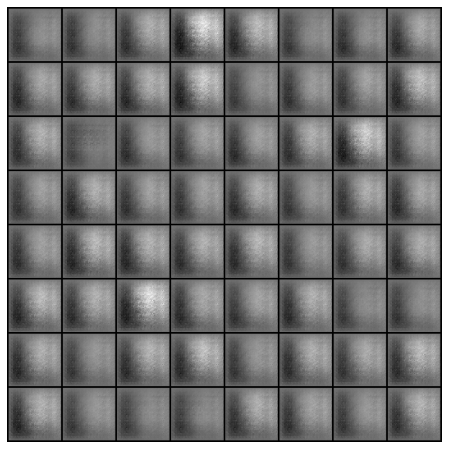

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 0.2007

[1/100][1/21]
- E_loss: 0.1850

[1/100][2/21]
- E_loss: 0.1682

[1/100][3/21]
- E_loss: 0.1515

[1/100][4/21]
- E_loss: 0.1970

[1/100][5/21]
- E_loss: 0.1706

[1/100][6/21]
- E_loss: 0.1779

[1/100][7/21]
- E_loss: 0.1563

[1/100][8/21]
- E_loss: 0.1592

[1/100][9/21]
- E_loss: 0.1544

[1/100][10/21]
- E_loss: 0.1515

[1/100][11/21]
- E_loss: 0.1608

[1/100][12/21]
- E_loss: 0.1540

[1/100][13/21]
- E_loss: 0.1745

[1/100][14/21]
- E_loss: 0.1820

[1/100][15/21]
- E_loss: 0.1603

[1/100][16/21]
- E_loss: 0.1497

[1/100][17/21]
- E_loss: 0.2011

[1/100][18/21]
- E_loss: 0.1676

[1/100][19/21]
- E_loss: 0.1774

[1/100][20/21]
- E_loss: 0.1681

[2/100][0/21]
- E_loss: 0.1863

[2/100][1/21]
- E_loss: 0.1623

[2/100][2/21]
- E_loss: 0.1886

[2/100][3/21]
- E_loss: 0.1629

[2/100][4/21]
- E_loss: 0.1692

[2/100][5/21]
- E_loss: 0.1499

[2/100][6/21]
- E_loss: 0.1765

[2/100][7/21]
- E_loss: 0.1531

[2/100][8/21]
- E_loss: 0.1429

[2/100][9/21]
- E_loss: 0.143

[13/100][0/21]
- E_loss: 0.1559

[13/100][1/21]
- E_loss: 0.1471

[13/100][2/21]
- E_loss: 0.1512

[13/100][3/21]
- E_loss: 0.1562

[13/100][4/21]
- E_loss: 0.1796

[13/100][5/21]
- E_loss: 0.1641

[13/100][6/21]
- E_loss: 0.1569

[13/100][7/21]
- E_loss: 0.1464

[13/100][8/21]
- E_loss: 0.1604

[13/100][9/21]
- E_loss: 0.1704

[13/100][10/21]
- E_loss: 0.1508

[13/100][11/21]
- E_loss: 0.1697

[13/100][12/21]
- E_loss: 0.1177

[13/100][13/21]
- E_loss: 0.1408

[13/100][14/21]
- E_loss: 0.1343

[13/100][15/21]
- E_loss: 0.1594

[13/100][16/21]
- E_loss: 0.1377

[13/100][17/21]
- E_loss: 0.1664

[13/100][18/21]
- E_loss: 0.1417

[13/100][19/21]
- E_loss: 0.1875

[13/100][20/21]
- E_loss: 0.1545

[14/100][0/21]
- E_loss: 0.1477

[14/100][1/21]
- E_loss: 0.1360

[14/100][2/21]
- E_loss: 0.1573

[14/100][3/21]
- E_loss: 0.1509

[14/100][4/21]
- E_loss: 0.1524

[14/100][5/21]
- E_loss: 0.1556

[14/100][6/21]
- E_loss: 0.1373

[14/100][7/21]
- E_loss: 0.1524

[14/100][8/21]
- E_loss: 0.1355


[24/100][15/21]
- E_loss: 0.1258

[24/100][16/21]
- E_loss: 0.1556

[24/100][17/21]
- E_loss: 0.1802

[24/100][18/21]
- E_loss: 0.1398

[24/100][19/21]
- E_loss: 0.1296

[24/100][20/21]
- E_loss: 0.1459

[25/100][0/21]
- E_loss: 0.1646

[25/100][1/21]
- E_loss: 0.1418

[25/100][2/21]
- E_loss: 0.1550

[25/100][3/21]
- E_loss: 0.1653

[25/100][4/21]
- E_loss: 0.1464

[25/100][5/21]
- E_loss: 0.1552

[25/100][6/21]
- E_loss: 0.1367

[25/100][7/21]
- E_loss: 0.1582

[25/100][8/21]
- E_loss: 0.1671

[25/100][9/21]
- E_loss: 0.1452

[25/100][10/21]
- E_loss: 0.1387

[25/100][11/21]
- E_loss: 0.1331

[25/100][12/21]
- E_loss: 0.1351

[25/100][13/21]
- E_loss: 0.1446

[25/100][14/21]
- E_loss: 0.1729

[25/100][15/21]
- E_loss: 0.1607

[25/100][16/21]
- E_loss: 0.1499

[25/100][17/21]
- E_loss: 0.1475

[25/100][18/21]
- E_loss: 0.1527

[25/100][19/21]
- E_loss: 0.1331

[25/100][20/21]
- E_loss: 0.1373

[26/100][0/21]
- E_loss: 0.1567

[26/100][1/21]
- E_loss: 0.1372

[26/100][2/21]
- E_loss: 0

[36/100][9/21]
- E_loss: 0.1408

[36/100][10/21]
- E_loss: 0.1525

[36/100][11/21]
- E_loss: 0.1510

[36/100][12/21]
- E_loss: 0.1484

[36/100][13/21]
- E_loss: 0.1543

[36/100][14/21]
- E_loss: 0.1562

[36/100][15/21]
- E_loss: 0.1634

[36/100][16/21]
- E_loss: 0.1351

[36/100][17/21]
- E_loss: 0.1421

[36/100][18/21]
- E_loss: 0.1350

[36/100][19/21]
- E_loss: 0.1399

[36/100][20/21]
- E_loss: 0.1335

[37/100][0/21]
- E_loss: 0.1511

[37/100][1/21]
- E_loss: 0.1598

[37/100][2/21]
- E_loss: 0.1327

[37/100][3/21]
- E_loss: 0.1382

[37/100][4/21]
- E_loss: 0.1539

[37/100][5/21]
- E_loss: 0.1245

[37/100][6/21]
- E_loss: 0.1631

[37/100][7/21]
- E_loss: 0.1630

[37/100][8/21]
- E_loss: 0.1505

[37/100][9/21]
- E_loss: 0.1609

[37/100][10/21]
- E_loss: 0.1684

[37/100][11/21]
- E_loss: 0.1298

[37/100][12/21]
- E_loss: 0.1645

[37/100][13/21]
- E_loss: 0.1586

[37/100][14/21]
- E_loss: 0.1417

[37/100][15/21]
- E_loss: 0.1306

[37/100][16/21]
- E_loss: 0.1514

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 0.1649

[48/100][4/21]
- E_loss: 0.1338

[48/100][5/21]
- E_loss: 0.1649

[48/100][6/21]
- E_loss: 0.1335

[48/100][7/21]
- E_loss: 0.1184

[48/100][8/21]
- E_loss: 0.1578

[48/100][9/21]
- E_loss: 0.1313

[48/100][10/21]
- E_loss: 0.1307

[48/100][11/21]
- E_loss: 0.1447

[48/100][12/21]
- E_loss: 0.1252

[48/100][13/21]
- E_loss: 0.1497

[48/100][14/21]
- E_loss: 0.1464

[48/100][15/21]
- E_loss: 0.1493

[48/100][16/21]
- E_loss: 0.1340

[48/100][17/21]
- E_loss: 0.1879

[48/100][18/21]
- E_loss: 0.1441

[48/100][19/21]
- E_loss: 0.1659

[48/100][20/21]
- E_loss: 0.1451

[49/100][0/21]
- E_loss: 0.1383

[49/100][1/21]
- E_loss: 0.1610

[49/100][2/21]
- E_loss: 0.1319

[49/100][3/21]
- E_loss: 0.1409

[49/100][4/21]
- E_loss: 0.1505

[49/100][5/21]
- E_loss: 0.1104

[49/100][6/21]
- E_loss: 0.1397

[49/100][7/21]
- E_loss: 0.1456

[49/100][8/21]
- E_loss: 0.1643

[49/100][9/21]
- E_loss: 0.1555

[49/100][10/21]
- E_loss: 0.1714

[49/100][11/21]
- E_loss: 0.125

[59/100][18/21]
- E_loss: 0.1333

[59/100][19/21]
- E_loss: 0.1514

[59/100][20/21]
- E_loss: 0.1604

[60/100][0/21]
- E_loss: 0.1521

[60/100][1/21]
- E_loss: 0.1485

[60/100][2/21]
- E_loss: 0.1702

[60/100][3/21]
- E_loss: 0.1366

[60/100][4/21]
- E_loss: 0.1240

[60/100][5/21]
- E_loss: 0.1369

[60/100][6/21]
- E_loss: 0.1628

[60/100][7/21]
- E_loss: 0.1221

[60/100][8/21]
- E_loss: 0.1614

[60/100][9/21]
- E_loss: 0.1450

[60/100][10/21]
- E_loss: 0.1106

[60/100][11/21]
- E_loss: 0.1570

[60/100][12/21]
- E_loss: 0.1367

[60/100][13/21]
- E_loss: 0.1441

[60/100][14/21]
- E_loss: 0.1485

[60/100][15/21]
- E_loss: 0.1241

[60/100][16/21]
- E_loss: 0.1449

[60/100][17/21]
- E_loss: 0.1509

[60/100][18/21]
- E_loss: 0.1612

[60/100][19/21]
- E_loss: 0.1574

[60/100][20/21]
- E_loss: 0.1662

[61/100][0/21]
- E_loss: 0.1515

[61/100][1/21]
- E_loss: 0.1315

[61/100][2/21]
- E_loss: 0.1332

[61/100][3/21]
- E_loss: 0.1679

[61/100][4/21]
- E_loss: 0.1546

[61/100][5/21]
- E_loss: 0.12

[71/100][12/21]
- E_loss: 0.1368

[71/100][13/21]
- E_loss: 0.1463

[71/100][14/21]
- E_loss: 0.1686

[71/100][15/21]
- E_loss: 0.1546

[71/100][16/21]
- E_loss: 0.1364

[71/100][17/21]
- E_loss: 0.1261

[71/100][18/21]
- E_loss: 0.1552

[71/100][19/21]
- E_loss: 0.1500

[71/100][20/21]
- E_loss: 0.1262

[72/100][0/21]
- E_loss: 0.1034

[72/100][1/21]
- E_loss: 0.1743

[72/100][2/21]
- E_loss: 0.1302

[72/100][3/21]
- E_loss: 0.1230

[72/100][4/21]
- E_loss: 0.1510

[72/100][5/21]
- E_loss: 0.1472

[72/100][6/21]
- E_loss: 0.1375

[72/100][7/21]
- E_loss: 0.1427

[72/100][8/21]
- E_loss: 0.1503

[72/100][9/21]
- E_loss: 0.1829

[72/100][10/21]
- E_loss: 0.1619

[72/100][11/21]
- E_loss: 0.1389

[72/100][12/21]
- E_loss: 0.1322

[72/100][13/21]
- E_loss: 0.1402

[72/100][14/21]
- E_loss: 0.1306

[72/100][15/21]
- E_loss: 0.1488

[72/100][16/21]
- E_loss: 0.1304

[72/100][17/21]
- E_loss: 0.1479

[72/100][18/21]
- E_loss: 0.1725

[72/100][19/21]
- E_loss: 0.1564

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 0.1325

[83/100][7/21]
- E_loss: 0.1360

[83/100][8/21]
- E_loss: 0.1480

[83/100][9/21]
- E_loss: 0.1450

[83/100][10/21]
- E_loss: 0.1274

[83/100][11/21]
- E_loss: 0.1537

[83/100][12/21]
- E_loss: 0.1472

[83/100][13/21]
- E_loss: 0.1458

[83/100][14/21]
- E_loss: 0.1543

[83/100][15/21]
- E_loss: 0.1596

[83/100][16/21]
- E_loss: 0.1372

[83/100][17/21]
- E_loss: 0.1305

[83/100][18/21]
- E_loss: 0.1774

[83/100][19/21]
- E_loss: 0.1550

[83/100][20/21]
- E_loss: 0.1435

[84/100][0/21]
- E_loss: 0.1678

[84/100][1/21]
- E_loss: 0.1493

[84/100][2/21]
- E_loss: 0.1474

[84/100][3/21]
- E_loss: 0.1290

[84/100][4/21]
- E_loss: 0.1307

[84/100][5/21]
- E_loss: 0.1444

[84/100][6/21]
- E_loss: 0.1559

[84/100][7/21]
- E_loss: 0.1559

[84/100][8/21]
- E_loss: 0.1384

[84/100][9/21]
- E_loss: 0.1503

[84/100][10/21]
- E_loss: 0.1332

[84/100][11/21]
- E_loss: 0.1405

[84/100][12/21]
- E_loss: 0.1532

[84/100][13/21]
- E_loss: 0.1451

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.1413

[95/100][1/21]
- E_loss: 0.1335

[95/100][2/21]
- E_loss: 0.1563

[95/100][3/21]
- E_loss: 0.1418

[95/100][4/21]
- E_loss: 0.1550

[95/100][5/21]
- E_loss: 0.1393

[95/100][6/21]
- E_loss: 0.1547

[95/100][7/21]
- E_loss: 0.1473

[95/100][8/21]
- E_loss: 0.1946

[95/100][9/21]
- E_loss: 0.1675

[95/100][10/21]
- E_loss: 0.1240

[95/100][11/21]
- E_loss: 0.1231

[95/100][12/21]
- E_loss: 0.1388

[95/100][13/21]
- E_loss: 0.1206

[95/100][14/21]
- E_loss: 0.1429

[95/100][15/21]
- E_loss: 0.1535

[95/100][16/21]
- E_loss: 0.1640

[95/100][17/21]
- E_loss: 0.1214

[95/100][18/21]
- E_loss: 0.1273

[95/100][19/21]
- E_loss: 0.1607

[95/100][20/21]
- E_loss: 0.1297

[96/100][0/21]
- E_loss: 0.1099

[96/100][1/21]
- E_loss: 0.1359

[96/100][2/21]
- E_loss: 0.1523

[96/100][3/21]
- E_loss: 0.1563

[96/100][4/21]
- E_loss: 0.1351

[96/100][5/21]
- E_loss: 0.1386

[96/100][6/21]
- E_loss: 0.1658

[96/100][7/21]
- E_loss: 0.1638

[96/100][8/21]
- E_loss: 0.1553


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

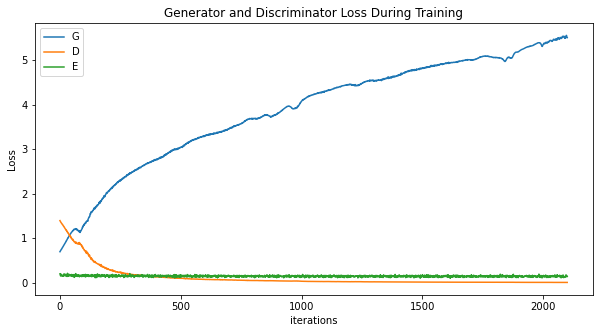

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

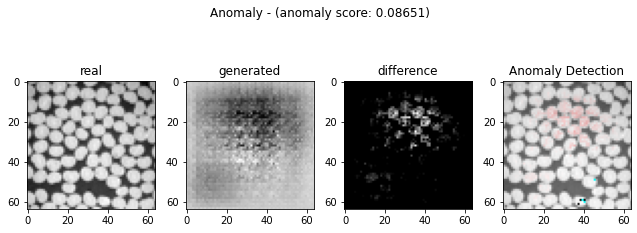

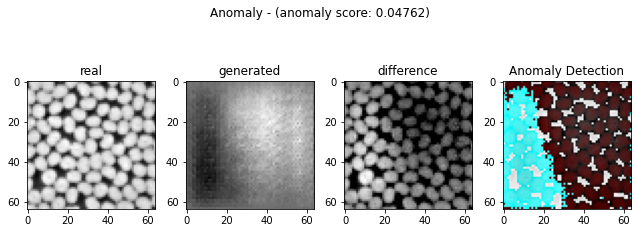

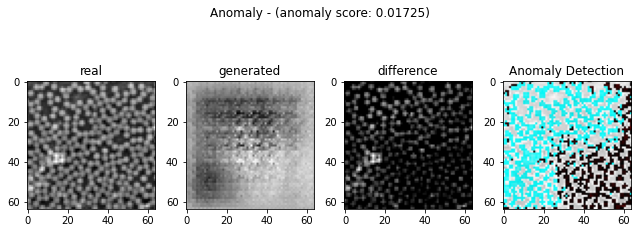

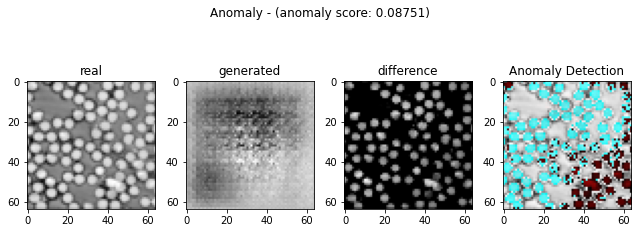

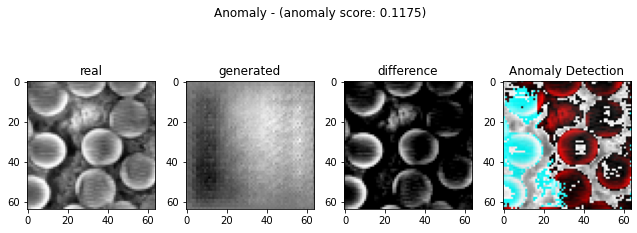

...

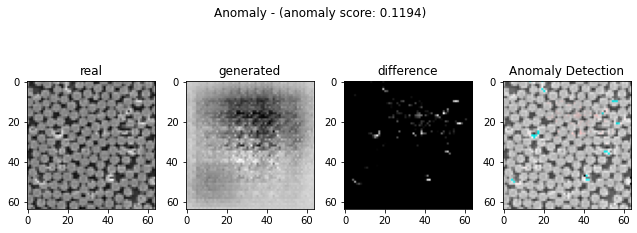

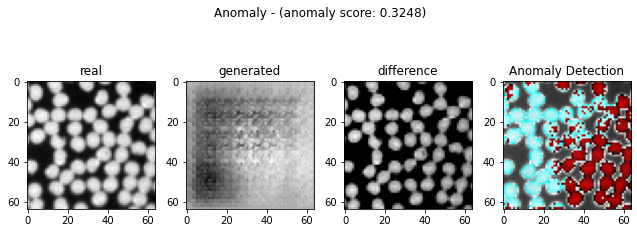

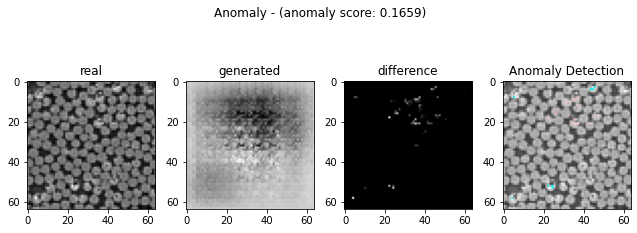

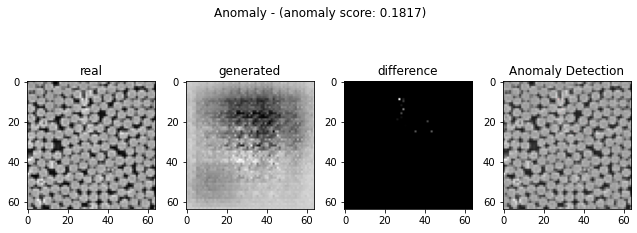

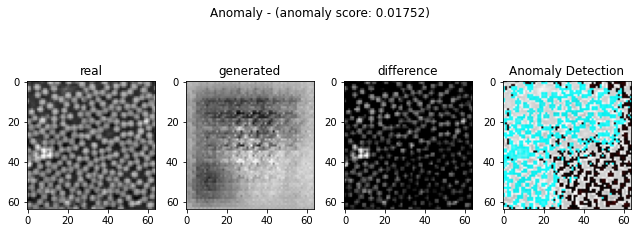

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.15087891 0.80053711 0.5090332  0.390625   0.58349609 0.34570312
 0.56933594 0.69042969 0.38745117 0.65722656 0.12182617 0.02856445
 0.45361328 0.56030273 0.65307617 0.26049805 0.44189453 0.42285156
 0.23144531 0.48144531 0.29443359 0.42919922 0.57910156 0.08374023
 0.64111328 0.38842773 0.68066406 0.65893555 0.69726562 0.50390625
 0.44702148 0.50488281 0.58032227 0.36645508 0.70776367 0.44799805
 0.55688477 0.13085938 0.48461914 0.48388672 0.02319336 0.57373047
 0.38354492 0.00561523 0.52758789 0.609375   0.04711914 0.52270508
 0.01000977 0.62744141 0.83740234 0.00756836 0.         0.42089844
 0.69775391 0.0390625  0.5402832  0.01928711 0.00317383 0.51953125]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.4137166341145833

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[-0.30978510393266256, 0.017804146239154987, -0.09028079950301121, -0.04364199540040749, 0.04645589200816021, 0.010223746646903262, -0.002964382304801081, -0.015216674982931989, -0.019784231926544882, 0.015453079258162564, -0.2853492130333187, -0.02214428782099616, -0.006856805530386353, 0.017128767014706628, 0.06692901186741529, 0.0047136086037141665, -0.2608952581157235, -0.28775778458524837, 0.3165076027513678, 0.031911375204377784, -0.017492239430822603, 0.01590235112032607, -0.004316230170951554, -0.40019461704036385, 0.005816264628240832, -0.04688965192997737, -0.029407956415243016, 0.020131225586128, -0.003362410417203025, -0.06646393142977414, 0.03768504094116653, -0.09084680302890188, -0.030689319941836074, -0.026288362004250675, -0.012986581306901376, -0.0138169901051976, 0.001632507393742079, -0.2678125812400898, -0.01879180721675805, 0.034644432569618244, -0.4696198608859954, 0.021720303878120024, -0.06783571305301031, 0.6160189536411531, -0.027005539212774328, 0.0231544268

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

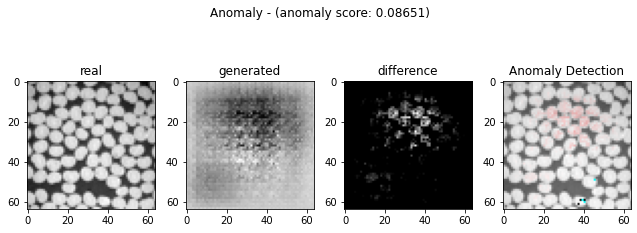

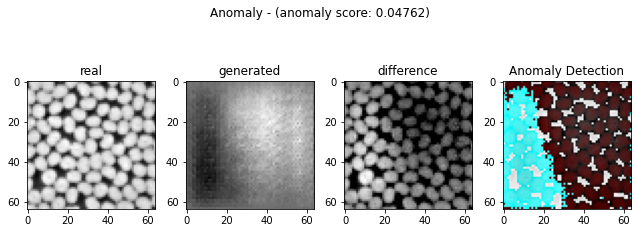

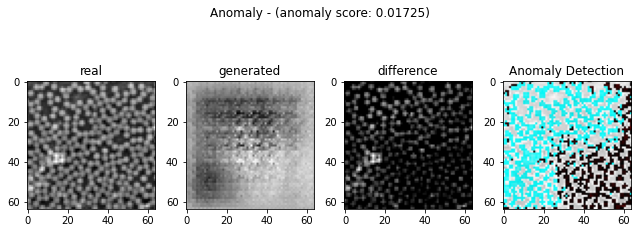

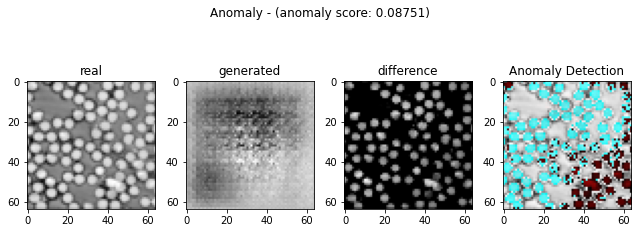

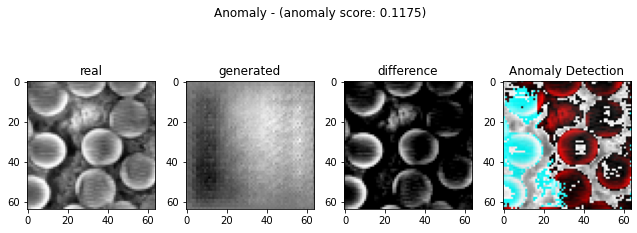

...

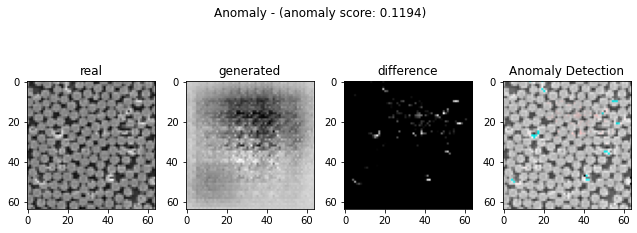

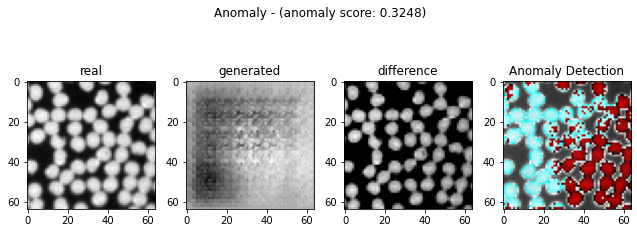

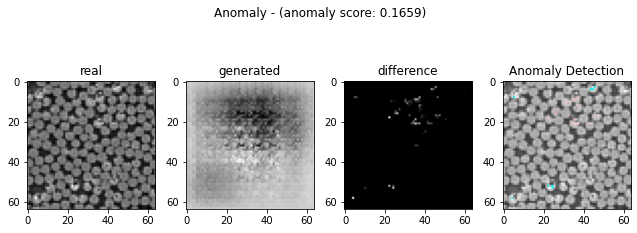

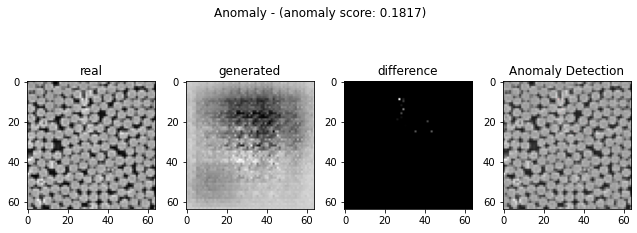

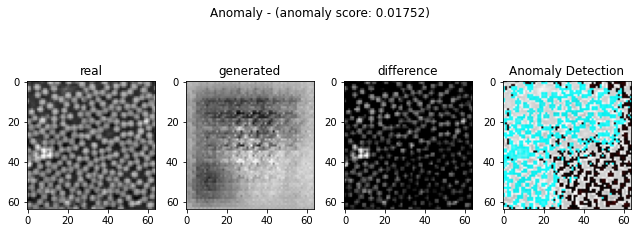

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.15087891 0.80053711 0.5090332  0.390625   0.58349609 0.34570312
 0.56933594 0.69042969 0.38745117 0.65722656 0.12182617 0.02856445
 0.45361328 0.56030273 0.65307617 0.26049805 0.44189453 0.42285156
 0.23144531 0.48144531 0.29443359 0.42919922 0.57910156 0.08374023
 0.64111328 0.38842773 0.68066406 0.65893555 0.69726562 0.50390625
 0.44702148 0.50488281 0.58032227 0.36645508 0.70776367 0.44799805
 0.55688477 0.13085938 0.48461914 0.48388672 0.02319336 0.57373047
 0.38354492 0.00561523 0.52758789 0.609375   0.04711914 0.52270508
 0.01000977 0.62744141 0.83740234 0.00756836 0.         0.42089844
 0.69775391 0.0390625  0.5402832  0.01928711 0.00317383 0.51953125]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[-0.30978510393266256, 0.017804146239154987, -0.09028079950301121, -0.04364199540040749, 0.04645589200816021, 0.010223746646903262, -0.002964382304801081, -0.015216674982931989, -0.019784231926544882, 0.015453079258162564, -0.2853492130333187, -0.02214428782099616, -0.006856805530386353, 0.017128767014706628, 0.06692901186741529, 0.0047136086037141665, -0.2608952581157235, -0.28775778458524837, 0.3165076027513678, 0.031911375204377784, -0.017492239430822603, 0.01590235112032607, -0.004316230170951554, -0.40019461704036385, 0.005816264628240832, -0.04688965192997737, -0.029407956415243016, 0.020131225586128, -0.003362410417203025, -0.06646393142977414, 0.03768504094116653, -0.09084680302890188, -0.030689319941836074, -0.026288362004250675, -0.012986581306901376, -0.0138169901051976, 0.001632507393742079, -0.2678125812400898, -0.01879180721675805, 0.034644432569618244, -0.4696198608859954, 0.021720303878120024, -0.06783571305301031, 0.6160189536411531, -0.027005539212774328, 0.0231544268

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 190, 190],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 188, 188],
         [184, 184, 184],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 206, 206],
         ...,
         [226, 226, 226],
         [232, 232, 232],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 198, 198],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[0.66839355 3.54637939 2.25501709 1.73046875 2.5848877  1.53146484
 2.5221582  3.05860352 1.71640869 2.91151367 0.53968994 0.12654053
 2.00950684 2.48214111 2.89312744 1.15400635 1.95759277 1.87323242
 1.02530273 2.13280273 1.30434082 1.90135254 2.56541992 0.37096924
 2.84013184 1.72073486 3.0153418  2.91908447 3.08888672 2.23230469
 1.98030518 2.23663086 2.57082764 1.623396   3.13539307 1.98463135
 2.46699951 0.57970703 2.14686279 2.14361816 0.10274658 2.54162598
 1.699104   0.02487549 2.33721436 2.69953125 0.20873779 2.3155835
 0.04434326 2.77956543 3.70969238 0.03352783 0.         1.86458008
 3.0910498  0.17304687 2.39345459 0.08544189 0.01406006 2.30152344]
